Major credit goes to this notebook for ideas https://www.kaggle.com/code/stassl/recovering-time-id-order, 
I have provided my own inference to attempt to recover time order in this notebook

In [1]:
#Installing and Importing Libraries
!pip install yfinance
import yfinance as yf
!pip install umap-learn
import umap
import pandas as pd
import numpy as np
# import yfinance as yf
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

from glob import glob
from joblib import Parallel, delayed
from sklearn.manifold import TSNE, SpectralEmbedding
from sklearn.preprocessing import minmax_scale
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer
from mpl_toolkits.axes_grid1 import make_axes_locatable

%config InlineBackend.figure_format = 'retina'
sns.set_theme('notebook', 'white', font_scale=1.2, palette='tab10')

In [2]:
#Downloading Kaggle Dataset for stock
data_dir = 'data'
df_files = pd.DataFrame({'book_path': glob(f'{data_dir}/book_train.parquet/**/*.parquet')}) \
    .assign(stock_id=lambda x: x.book_path.str.extract("stock_id=(\d+)").astype('int')) \
    .sort_values('stock_id')
df_target_train = pd.read_csv(f'{data_dir}/train.csv')
df_volatility_train = df_target_train.groupby('time_id').target.mean()

In [3]:
#Defining functions for EDA

def rmspe(y_true, y_pred):
    return ((((y_true - y_pred) / y_true)) ** 2).mean() ** 0.5

def plot_price(stock_id, time_id, price_name, kind, ax):
    r = df_files.query(f'stock_id == {stock_id}').iloc[0]
    df = pd.read_parquet(r.book_path, columns=['time_id', 'seconds_in_bucket', price_name])
    df = df.query(f'time_id == {time_id}').drop(columns='time_id').set_index('seconds_in_bucket').reindex(np.arange(600), method='ffill')
    min_diff = np.nanmin(abs(df[price_name].diff().where(lambda x: x > 0)))
    if kind == 'price_norm':
        df[price_name].plot.line(legend=False, ax=ax)
        ax.set_title(f'stock_id={stock_id}, time_id={time_id}: {price_name} normalized')
    elif kind == 'price_change':
        df = df[price_name].diff().reset_index()
        df.plot.bar(x='seconds_in_bucket', y=price_name, color=np.where(df[price_name] > 0, 'g', 'r'), legend=False, edgecolor='none', width=1, ax=ax)
        ax.set_title(f'stock_id={stock_id}, time_id={time_id}: {price_name} change')
        ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(min_diff))
    elif kind == 'ticks_change':
        df = df[price_name].diff().div(min_diff).reset_index()
        df.plot.bar(x='seconds_in_bucket', y=price_name, color=np.where(df[price_name] > 0, 'g', 'r'), legend=False, edgecolor='none', width=1, ax=ax)
        ax.set_title(f'stock_id={stock_id}, time_id={time_id}: {price_name} change (ticks)')
        ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(1))
    elif kind == 'price_original':
        df[price_name] = 0.01 / min_diff * df[price_name]
        df[price_name].plot.line(legend=False, ax=ax)
        ax.set_title(f'stock_id={stock_id}, time_id={time_id}: {price_name} original')

    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(30))
    ax.xaxis.set_tick_params(rotation=0)
    ax.set_axisbelow(True)
    ax.grid(axis='y', linestyle='--')
    ax.set_xlim(0, 600)
    
def plot_emb(emb, color, name, kind='volatility', fig=None, ax=None):
    if fig is None or ax is None:
        fig, ax = plt.subplots(figsize=(7, 7))
    if kind == 'volatility':
        norm = mpl.colors.LogNorm()
        ticks = mpl.ticker.LogLocator(2)
        formatter = mpl.ticker.ScalarFormatter()
    elif kind == 'date':
        norm = None
        ticks = None
        formatter = mpl.dates.AutoDateFormatter(mpl.dates.MonthLocator())
    plot = ax.scatter(emb[:, 0], emb[:, 1], s=3, c=color, edgecolors='none', cmap='jet', norm=norm);
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.2)    
    cb = fig.colorbar(plot, label=kind, format=formatter,
                      ticks=ticks, cax=cax)
    cb.ax.minorticks_off()
    ax.set_title(f'{name}')

To better understand the idea let's plot some charts for selected stock_id/time_id:

First graph is the normalised price as it appears in the dataset given to us by Optiver.
Second graph is simply the delta of each price movement (price.diff() formula). Price seems to change by integral multiples.
Third graph is price.diff() / min(price.diff()), thus we get price changes in terms of ticks (the miimum price difference). CLearly we see that the price changes as integer multiples of ticks.
Tha last graph is restored, real price = price * 0.01 / min(price.diff())

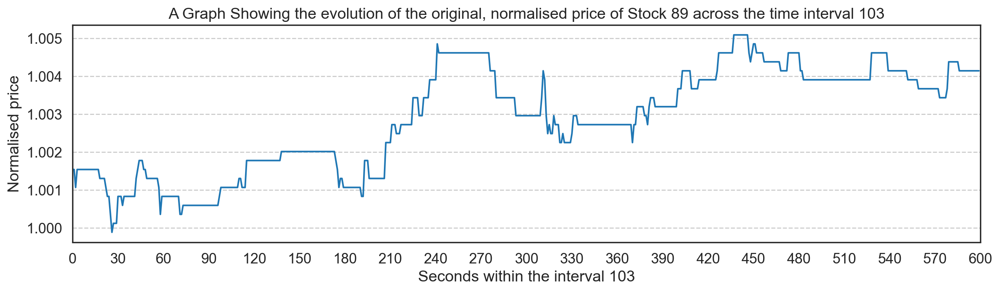

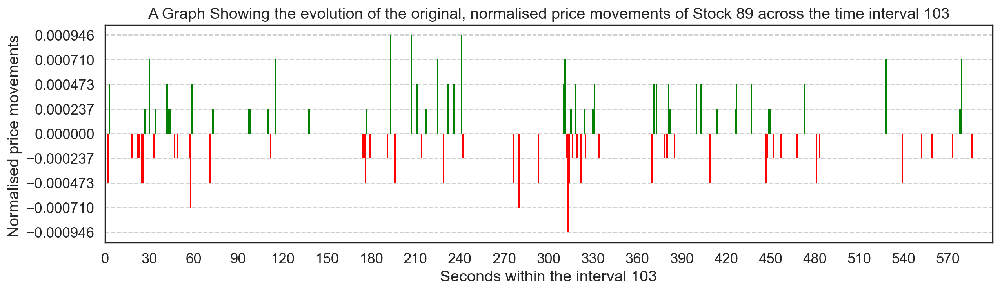

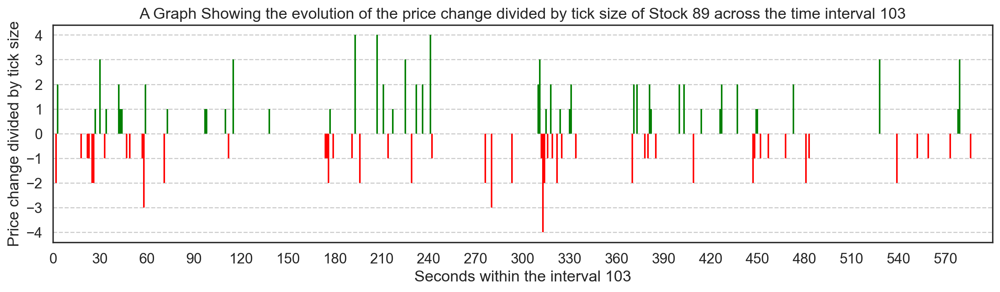

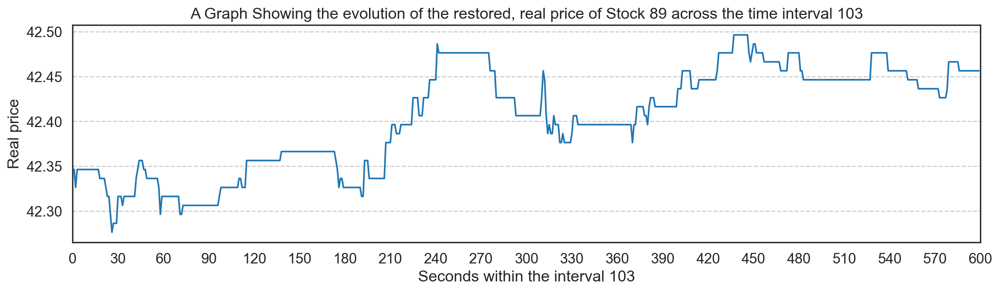

In [4]:
#Graphical EDA work
plot_types = ['price_norm', 'price_change', 'ticks_change', 'price_original']
for kind in plot_types:
    fig, ax = plt.subplots(figsize=(13, 4))
    plot_price(89, 103, 'ask_price1', kind, ax)
    if kind == 'price_norm':
        desc = 'original, normalised price of'
    elif kind == 'price_change':
        desc = 'original, normalised price movements of'
    elif kind == 'ticks_change':
        desc = 'price change divided by tick size of'
    elif kind == 'price_original':
        desc = 'restored, real price of'

    if kind == 'price_norm':
        y = 'Normalised price'
    elif kind == 'price_change':
        y = 'Normalised price movements '
    elif kind == 'ticks_change':
        y = 'Price change divided by tick size'
    elif kind == 'price_original':
        y = 'Real price'
        
    title = f"A Graph Showing the evolution of the {desc} Stock 89 across the time interval 103"
    ax.set_title(title)
    ax.set_xlabel('Seconds within the interval 103')
    ax.set_ylabel(y)
    plt.tight_layout()
    fig.savefig(f'stock_price_{kind}.png', dpi=300, bbox_inches='tight')


In [5]:
#calculating the real prices
def calc_price(df):
    diff = abs(df.diff())
    min_diff = np.nanmin(diff.where(lambda x: x > 0))
    n_ticks = (diff / min_diff).round()
    return 0.01 / np.nanmean(diff / n_ticks)

def calc_prices(r):
    df = pd.read_parquet(r.book_path, columns=['time_id', 'ask_price1', 'ask_price2', 'bid_price1', 'bid_price2'])
    df = df.groupby('time_id').apply(calc_price).to_frame('price').reset_index()
    df['stock_id'] = r.stock_id
    return df

In [6]:
df_prices_denorm = pd.concat(Parallel(n_jobs=-1, verbose=0)(delayed(calc_prices)(r) for _, r in df_files.iterrows()))

In [7]:
df_prices_denorm = df_prices_denorm.pivot(index = 'time_id', columns= 'stock_id',values= 'price')
df_prices_denorm

stock_id,0,1,2,3,4,5,6,7,8,9,...,115,116,118,119,120,122,123,124,125,126
time_id,,,,,,,,,,,,,,,,,,,,,
5,193.382499,152.416327,123.461428,226.012232,619.198910,738.256609,370.275801,245.870983,283.881404,238.394801,...,88.143530,246.326035,210.790493,66.225351,96.217049,142.352639,108.310134,84.344766,53.375172,310.446018
11,199.230489,149.512019,128.641219,249.893186,614.775587,769.481159,411.690103,256.711224,278.116800,244.391095,...,90.285607,275.920002,213.987639,63.064600,101.239489,136.924692,105.482065,91.095218,55.886795,300.948142
16,208.900108,104.885672,118.687626,164.755260,534.006468,584.016561,236.595134,208.127709,123.656642,177.405905,...,70.035150,189.724268,281.007926,53.520546,74.554427,93.370637,77.421019,55.054433,53.084003,194.495613
31,216.138269,137.831207,138.326846,235.951400,657.637025,804.561657,358.949356,260.607163,194.206656,232.626591,...,90.688217,256.869865,235.129520,61.245171,90.928457,134.847296,103.739264,92.465027,58.124482,259.149062
62,214.516335,140.650237,137.213402,238.242521,639.647230,765.430361,403.068356,250.621870,187.756607,243.460002,...,89.140911,248.061738,231.193774,59.542960,87.940275,125.482870,103.529649,96.060419,57.373160,259.214214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32751,192.207769,148.865368,132.110590,243.722214,652.082489,745.338533,389.702447,252.020435,252.114143,230.046724,...,88.523948,269.021445,241.987520,60.049757,93.429990,135.630818,103.531318,94.184826,56.814400,306.255498
32753,199.748994,143.562752,128.829956,245.019729,616.837441,755.527664,389.036260,249.891005,258.463170,241.465759,...,91.186063,269.457870,212.935865,62.066114,92.794336,136.533152,104.054983,87.874304,55.995629,290.136260
32758,198.471328,111.979022,142.683929,216.825656,591.479678,729.433334,509.977233,234.174952,132.590478,206.086532,...,80.310357,225.500215,211.873457,43.955594,80.582209,111.225451,89.826475,81.064096,56.597615,202.570521


Now we have the real price of stocks - the plot below exhibits the price distributions for each stock- able to identify stock 61 as AMZN - the most expensive stock during the duration fo the dataset (January 1, 2020, until March 31, 2021)

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


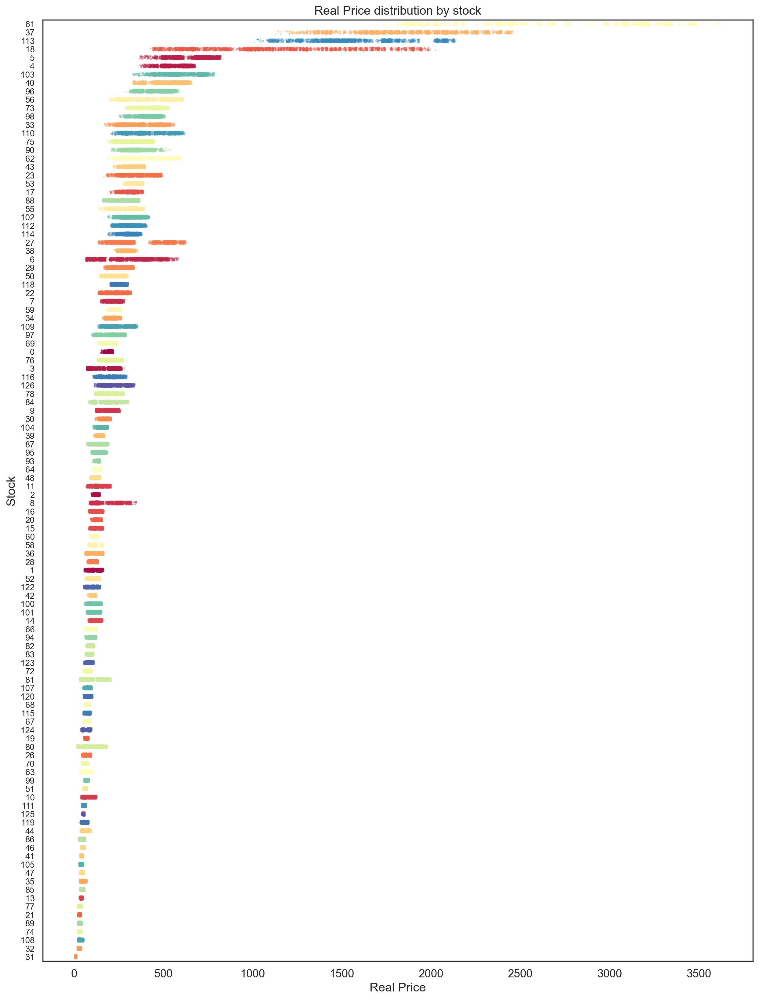

In [8]:
plt.figure(figsize=(15, 20))
ax = sns.stripplot(data=df_prices_denorm, orient='h', alpha=0.3, s=2, jitter=0.2,
                   order=df_prices_denorm.median().sort_values().index[::-1].tolist(), 
                   palette='Spectral')
ax.tick_params(axis='y', which='major', labelsize=10)
plt.xlabel('Real Price')
plt.ylabel('Stock')
plt.title('Real Price distribution by stock');
plt.savefig(f'Stock Price Distribution.png', dpi=300, bbox_inches='tight')

In [9]:
#downloading actual stock price data from yahoo finance form 1 Jan 2020 to 1 June 2021
SP100_tickers = pd.read_html('https://en.wikipedia.org/wiki/S%26P_100')[2].Symbol
SP100_tickers = SP100_tickers[SP100_tickers != 'BRK.B']
df_prices_real = yf.download(SP100_tickers.to_list(), start='2020-01-01', end='2021-06-01', interval='1d')

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  100 of 100 completed


In [10]:
#Garman-Klass Estimator for RV
df_volatility_real = 1 / 2 * np.log(df_prices_real.High / df_prices_real.Low) ** 2 - \
    (2 * np.log(2) - 1) * np.log(df_prices_real.Close / df_prices_real.Open) ** 2
df_volatility_real = df_volatility_real.mean(axis=1)

df_prices_real = df_prices_real.Open.fillna(df_prices_real.Open.mean()).dropna(axis=1).sample(frac=1)
df_volatility_real = df_volatility_real.loc[df_prices_real.index]
df_prices_real

Ticker,AAPL,ABBV,ABT,ACN,ADBE,AIG,AMD,AMGN,AMT,AMZN,...,TXN,UNH,UNP,UPS,USB,V,VZ,WFC,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,,
2020-09-28,112.146101,72.656763,96.215211,206.031476,487.970001,24.883914,79.120003,215.274791,216.043833,157.442505,...,123.786873,287.101634,182.678577,144.752861,29.263500,194.239424,45.870462,21.638643,42.850523,28.815179
2021-02-02,132.578491,87.814601,114.740217,236.826267,473.649994,34.545483,88.489998,210.016600,211.005420,169.000000,...,154.799905,317.014949,182.581658,139.884200,36.050885,194.745388,42.819425,27.600633,43.822402,38.470995
2021-05-06,125.107203,99.353265,110.168682,275.074599,485.670013,44.735769,77.629997,219.759237,219.457561,163.500000,...,163.641660,389.772416,205.321075,185.381485,50.976233,222.996256,46.842384,42.005177,44.254041,51.977871
2020-08-19,113.094409,80.830539,93.298483,219.864733,464.290009,26.245686,81.779999,209.486154,223.987728,165.150497,...,123.301356,295.610177,172.786680,135.912857,29.638672,192.583879,45.716426,21.656681,41.928911,34.727450
2020-02-14,78.807583,77.159163,81.368586,198.910063,376.279999,43.363203,55.189999,191.179636,225.433346,107.783997,...,116.123713,279.602173,164.514862,87.093330,43.981902,201.014410,44.230394,42.382478,36.290171,48.238263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-12,120.919940,99.223676,109.347431,271.036043,477.190002,46.570846,75.089996,221.636926,221.092676,159.250000,...,161.626835,386.271081,206.281486,182.862801,51.227971,217.169636,46.317589,42.661088,43.896849,51.998558
2020-10-08,113.355227,72.640115,99.814973,212.567221,499.049988,26.818129,88.110001,216.656784,216.657084,161.249496,...,129.622223,303.068998,185.669032,149.557778,32.182572,197.502025,46.016362,22.441408,44.209512,27.781969
2020-04-21,67.047369,67.849945,88.358838,160.052191,340.899994,19.815247,56.900002,201.530597,215.990075,120.830498,...,95.870780,255.483331,127.779734,84.077477,26.601109,156.341307,43.708375,23.682775,40.291904,31.869601


Note: this is adjusted price using stock splits e.g will have to multiply AMZN by 20 to get real unadjusted price for comparsion graphically at end

In [11]:
df_prices_denorm_scaled = df_prices_denorm.fillna(df_prices_denorm.mean())
df_prices_denorm_scaled = pd.DataFrame(minmax_scale(df_prices_denorm_scaled), index=df_prices_denorm.index)

df_prices_real_scaled = df_prices_real.fillna(df_prices_real.mean())
df_prices_real_scaled = pd.DataFrame(minmax_scale(df_prices_real_scaled), index=df_prices_real.index)


Now we have the real prices – we can use this to recover the chronological order.

As there are 112 different stocks, I can model it as a point in a 112-dimensional space. I hypothesize that it would be nonsensical for a prediction challenge to have the order completely randomized. Therefore, the neighboring `time_id`s should also be close in space. This means that even though the `time_id`s may exist in a 112-dimensional space, they might be able to be represented by a **smooth, 1-dimensional curve**.

Therefore, below I apply dimensionality reduction methods, such as **t-SNE** (t-Distributed Stochastic Neighbour Embedding), **PCA** (Principal Component Analysis), **UMAP** (Uniform Manifold Approximation and Projection), and **Spectral Embeddings**.

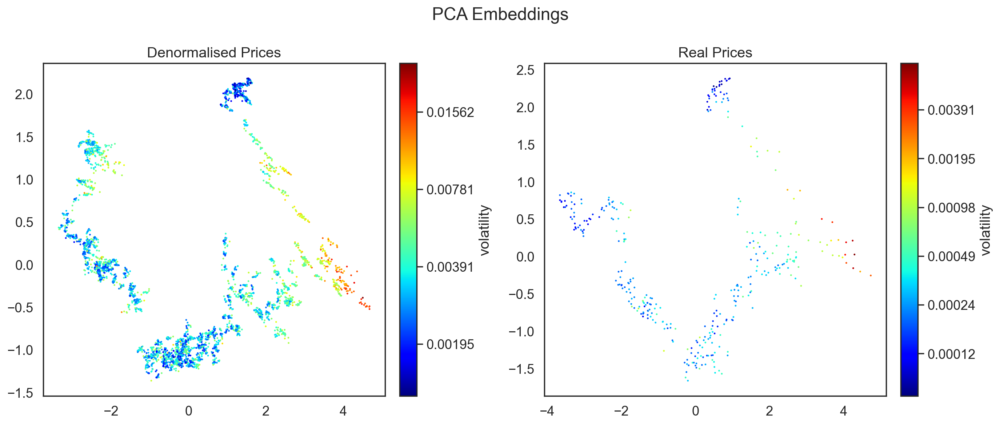

In [12]:
f, ax = plt.subplots(1, 2, figsize=(14, 6))
emb = PCA(n_components=2)
emb_denorm = emb.fit_transform(df_prices_denorm_scaled)
emb_real = emb.fit_transform(df_prices_real_scaled)
plot_emb(emb_denorm, df_volatility_train, 'Denormalised Prices', 'volatility', f, ax[0])
plot_emb(emb_real, df_volatility_real, 'Real Prices', 'volatility', f, ax[1])
f.suptitle('PCA Embeddings')
plt.tight_layout()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 3830 samples in 0.002s...
[t-SNE] Computed neighbors for 3830 samples in 0.240s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3830
[t-SNE] Computed conditional probabilities for sample 2000 / 3830
[t-SNE] Computed conditional probabilities for sample 3000 / 3830
[t-SNE] Computed conditional probabilities for sample 3830 / 3830
[t-SNE] Mean sigma: 0.232494
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.946220
[t-SNE] KL divergence after 2000 iterations: 0.152490
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 355 samples in 0.001s...
[t-SNE] Computed neighbors for 355 samples in 0.038s...
[t-SNE] Computed conditional probabilities for sample 355 / 355
[t-SNE] Mean sigma: 0.748880
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.533482
[t-SNE] KL divergence after 2000 iterations: 0.093300


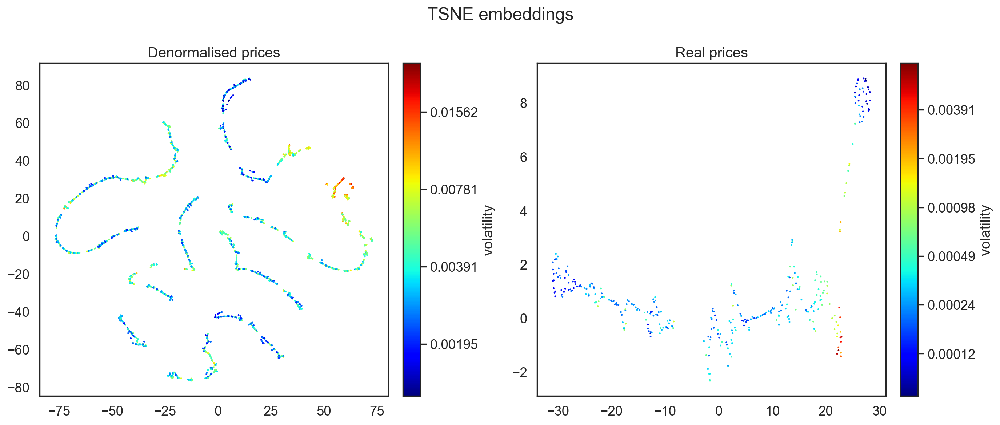

In [13]:
f, ax = plt.subplots(1, 2, figsize=(14, 6))        
emb = TSNE(n_components=2, perplexity=40, learning_rate=50, 
           verbose=1, init='pca', n_iter=2000,
           early_exaggeration=12)
emb_denorm = emb.fit_transform(df_prices_denorm_scaled)
emb_real = emb.fit_transform(df_prices_real_scaled)
plot_emb(emb_denorm, df_volatility_train, 'Denormalised prices', 'volatility', f, ax[0])
plot_emb(emb_real, df_volatility_real, 'Real prices', 'volatility', f, ax[1])
f.suptitle('TSNE embeddings')
plt.tight_layout()

UMAP(local_connectivity=1, low_memory=False, n_neighbors=60, repulsion_strength=1, spread=0.5, target_metric='euclidean', verbose=True)
Fri Apr  4 22:26:04 2025 Construct fuzzy simplicial set
Fri Apr  4 22:26:09 2025 Finding Nearest Neighbors
Fri Apr  4 22:26:10 2025 Finished Nearest Neighbor Search
Fri Apr  4 22:26:12 2025 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Fri Apr  4 22:26:17 2025 Finished embedding
UMAP(local_connectivity=1, low_memory=False, n_neighbors=60, repulsion_strength=1, spread=0.5, target_metric='euclidean', verbose=True)
Fri Apr  4 22:26:17 2025 Construct fuzzy simplicial set
Fri Apr  4 22:26:17 2025 Finding Nearest Neighbors
Fri Apr  4 22:26:17 2025 Finished Nearest Neighbor Search
Fri Apr  4 22:26:17 2025 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Fri Apr  4 22:26:18 2025 Finished embedding


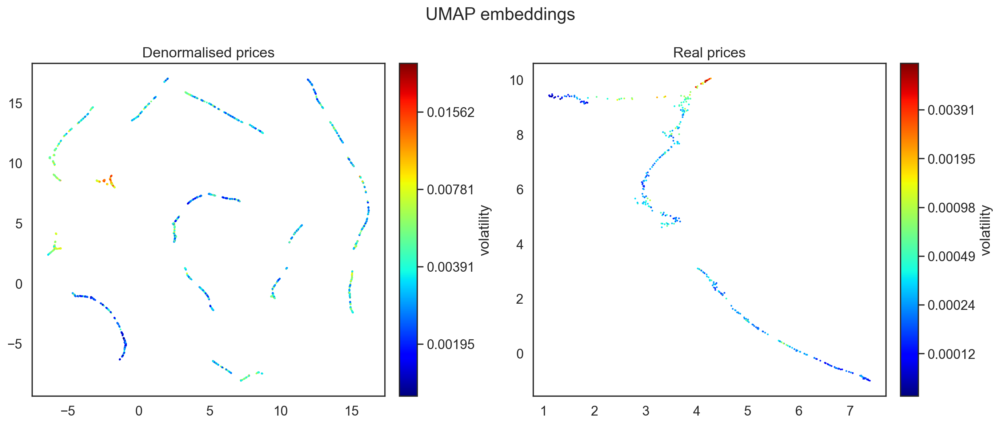

In [14]:
f, ax = plt.subplots(1, 2, figsize=(14, 6))        
emb = umap.UMAP(n_neighbors=60, min_dist=0.1, target_metric='euclidean', 
                init='spectral',  low_memory=False, verbose=True, 
                spread=0.5, local_connectivity=1, repulsion_strength=1, 
                negative_sample_rate=5)
emb_denorm = emb.fit_transform(df_prices_denorm_scaled)
emb_real = emb.fit_transform(df_prices_real_scaled)
plot_emb(emb_denorm, df_volatility_train, 'Denormalised prices', 'volatility', f, ax[0])
plot_emb(emb_real, df_volatility_real, 'Real prices', 'volatility', f, ax[1])
f.suptitle('UMAP embeddings')
plt.tight_layout()

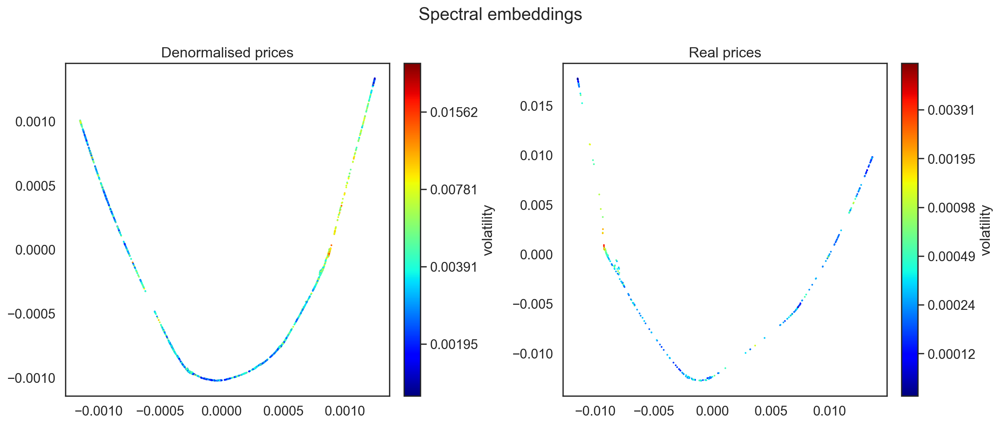

In [15]:
f, ax = plt.subplots(1, 2, figsize=(14, 6))        
emb = SpectralEmbedding(random_state=2)
emb_denorm = emb.fit_transform(df_prices_denorm_scaled)
emb_real = emb.fit_transform(df_prices_real_scaled)
plot_emb(emb_denorm, df_volatility_train, 'Denormalised prices', 'volatility', f, ax[0])
plot_emb(emb_real, df_volatility_real, 'Real prices', 'volatility', f, ax[1])
f.suptitle('Spectral embeddings')
plt.tight_layout()
plt.savefig(f'Spectral Embeddings.png', dpi=300, bbox_inches='tight')

From the method of **Spectral Embeddings**, I could observe the 1-dimensional manifold as required, with a huge amount of similarities between the embeddings of the reconstructed prices and the real prices, confirming that price normalisation is working correctly. Furthermore, we could also observe the single outlying cluster of high volatility, which of course alludes to the 2020 Stock Market crash, as a result of Covid-19.

To confirm the hypothesis that spectral embeddings sort the data by date, below depicts the same plot, but colour-coded it by date, which I can infer from the Yahoo Finance's dataset. 

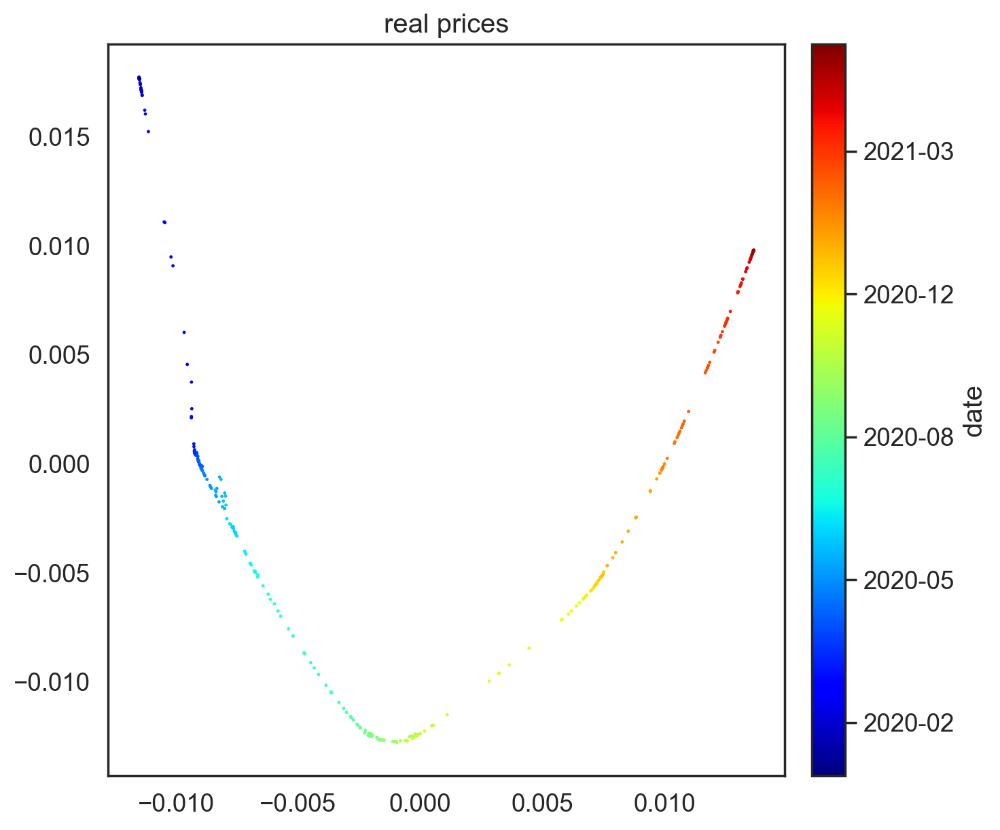

In [18]:
plot_emb(emb_real, [mpl.dates.date2num(i) for i in df_volatility_real.index], 'real prices', 'date')
plt.savefig(f'Real Prices Date.png', dpi=300, bbox_inches='tight')

Quite clearly, one observes that spectral embeding sorts the observations by date. Therefore we are able to use the X-coordinates of spectral embeddings to approximately recover the chronological order of time_ids.

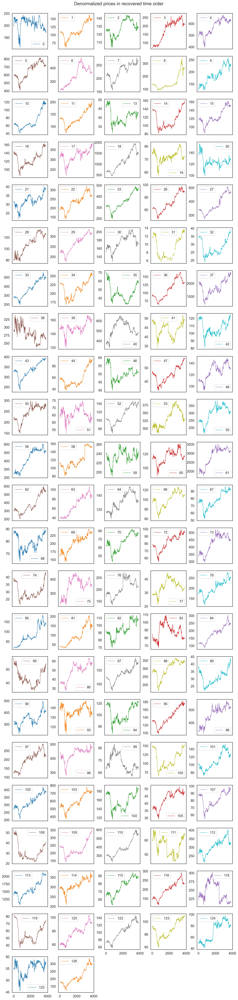

In [19]:
df_prices_denorm_ordered = df_prices_denorm.iloc[np.argsort(-emb_denorm[:, 0])]
df_prices_denorm_ordered.reset_index(drop=True).rolling(10).mean(). \
    plot(subplots=True, layout=(-1, 5), figsize=(15, 60), sharex=True, lw=1)
plt.suptitle('Denormalized prices in recovered time order')
plt.subplots_adjust(top=0.97, wspace=0.3);


One easy observation from this is that clearly the 2020 stock market crash from COvid-19 is consistent in the stock prices. 

We also plot real prices in order to compare:

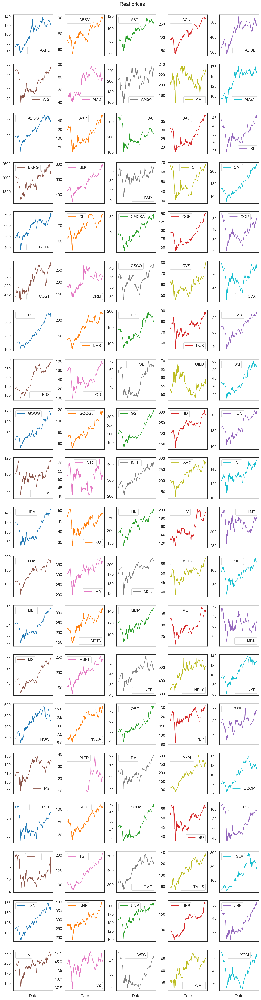

In [20]:
df_prices_real.plot(subplots=True, layout=(-1, 5), figsize=(15, 60), sharex=True, lw=1);
plt.xticks([])
plt.suptitle('Real prices')
plt.subplots_adjust(top=0.97, wspace=0.3);

We can see clealry that Stock 61's price evolves very similarly to AMZN. We plot the reconstructed and the real price in one plot for easier visualisation of this, noting that we need to convert the Yahoo finance prices as they are adjsuted for stock splits (Amazon has a 20:1 https://companiesmarketcap.com/gbp/amazon/stock-splits/#google_vignette)  

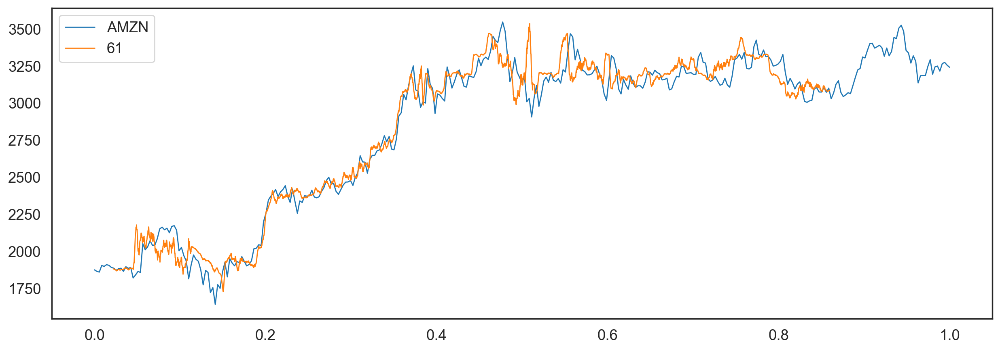

In [21]:
df_prices_real['AMZN'] *= 20 # to allow for stock split

_, ax = plt.subplots(1, 1, figsize=(15, 5))
df_prices_real['AMZN'].sort_index().to_frame().set_index(np.linspace(0, 1, len(df_prices_real))).plot(lw=1, ax=ax)
df_prices_denorm_ordered[61].rolling(10).mean().to_frame().set_index(np.linspace(0.02, 0.86, len(df_prices_denorm_ordered))).plot(lw=1, ax=ax);

Clearly we observe that we have approximately reconstructed Amazon's price and the chronological order of the `time_id`s. We also note that we can compare General Electric's real vs reconsructed stock price evolution, to reach certainity that we have correctly reconstructed the time series dataset.We note the 0.2:1 stock split: https://www.investing.com/equities/general-electric-historical-data-splits

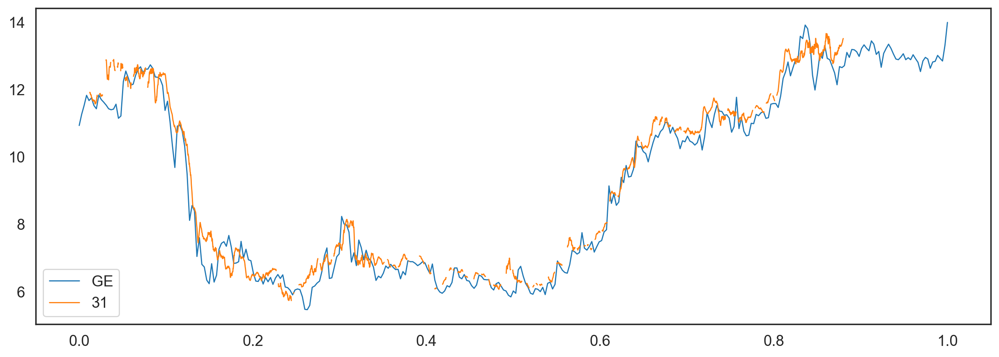

In [22]:
#0.2:1  stock split https://www.investing.com/equities/general-electric-historical-data-splits
df_prices_real['GE']*= 0.2
_, ax = plt.subplots(1, 1, figsize=(15, 5))
df_prices_real['GE'].sort_index().to_frame().set_index(np.linspace(0, 1, len(df_prices_real))).plot(lw=1, ax=ax)
df_prices_denorm_ordered[31].rolling(10).mean().to_frame().set_index(np.linspace(0, 0.88, len(df_prices_denorm_ordered))).plot(lw=1, ax=ax);